In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (23, 9)

import warnings

warnings.filterwarnings("ignore")

# For adtk
import matplotlib.style as mplstyle

if "seaborn-v0_8-whitegrid" in mplstyle.library:
    mplstyle.library["seaborn-whitegrid"] = mplstyle.library["seaborn-v0_8-whitegrid"]

np.random.seed(42)

# Точечные аномалии

## 0. Utils

Тут наборчик вспомогательных функций для оценки метрик и отрисовки графиков

In [2]:
from etna.datasets import TSDataset
from etna.analysis import plot_anomalies as plot_anomalies_etna
from adtk.visualization import plot
from adtk.metrics import recall, precision, f1_score

In [3]:
def convert_to_etna(df):
    df_etna = df_etna = pd.melt(
        pd.DataFrame(df).reset_index(),
        id_vars="timestamp",
        value_vars=[f"segment_{i}" for i in range(1, 8)],
        var_name="segment",
        value_name="target",
    )
    return df_etna


def anomaly_dict_to_mask(df, anomaly_dict):
    df_mask = df.copy()
    df_mask[:] = 0
    for segment, indexes in anomaly_dict.items():
        df_mask.loc[indexes, segment] = 1
    return df_mask


def eval_etna(df, anomaly_dict):
    anomalies_mask = anomaly_dict_to_mask(df, anomaly_dict)

    plot_anomalies_etna(ts, anomaly_dict)
    metrics, metrics_agg = eval_metrics(df_anomaly, anomalies_mask, metrics_list=[precision, recall, f1_score])
    print(metrics_agg)
    return metrics, metrics_agg, anomalies_mask


def eval_metrics(y_true, y_pred, metrics_list):
    metrics = {}
    metrics_agg = {}
    for metric in metrics_list:
        name = metric.__name__
        metrics[name] = metric(y_true, y_pred)
        metrics_agg[name] = pd.Series(metric(y_true, y_pred)).mean()

    return metrics, metrics_agg


def plot_anomalies(series, detector):
    try:
        anomalies = detector.fit_detect(series)
    except:
        anomalies = detector.detect(series)

    metrics, metrics_agg = eval_metrics(df_anomaly, anomalies, metrics_list=[precision, recall, f1_score])
    plot(
        series,
        anomaly=anomalies,
        ts_linewidth=1,
        ts_markersize=3,
        anomaly_markersize=5,
        anomaly_color="red",
        anomaly_tag="marker",
    )
    print(metrics_agg)
    return metrics, metrics_agg, anomalies

## 1. Генерация данных

На лекции мы обсуждали, что для подбора и настроки алгоритма поиска аномалий под вашу задачу бывает полезно поэксперементировать на синтетических данных -- для них известна разметка, на которой можно замерять качество. На семинаре мы как раз попробуем позапускать наши алгоритмы на такой слоеной синтетике:

- Белый шум + точечные выбросы
- Белый шум + линейный тренд + точечные выбросы
- Белый шум + сезонность + точечные выбросы
- Белый шум + линейный тренд + сезонность + точечные выбросы

<Axes: xlabel='timestamp'>

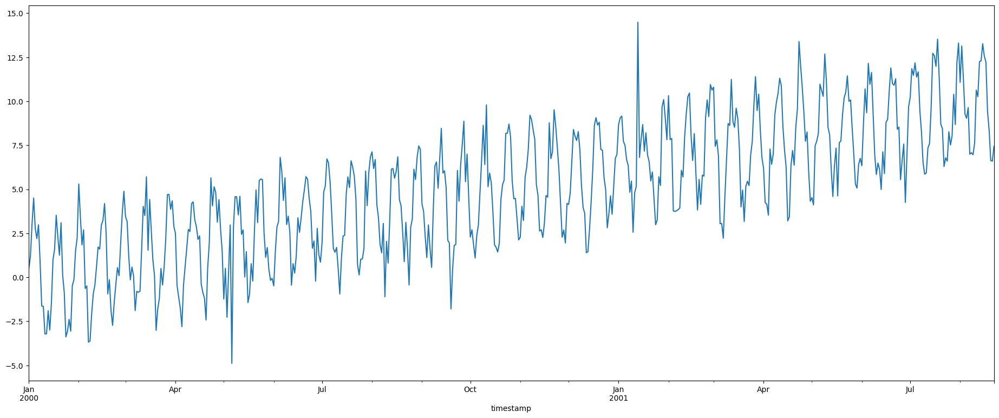

In [4]:
# Количество точек по времени
N = 600

# Масштаб компонент
TREND = 1 / 60
SEASONAL = 3
ANOMALY = 6

# Периоды сезонностей
SEASONALITY_1 = 7
SEASONALITY_2 = 14

timestamps = np.arange(0, N)

noise_component = np.random.normal(size=N)
trend_component = timestamps * TREND
seasonal_component = np.sin(1 / SEASONALITY_1 * 2 * np.pi * timestamps) * SEASONAL
anomaly_component = np.random.choice([-1, 0, 1], p=[0.02, 0.96, 0.02], size=N) * ANOMALY

seasonal_component_2 = np.sin(1 / SEASONALITY_2 * 2 * np.pi * timestamps) * SEASONAL
anomaly_component_2 = (
    (timestamps % SEASONALITY_2 == 0) * np.random.choice([-1, 0, 1], p=[0.03, 0.94, 0.03], size=N) * ANOMALY
)

anomaly_mask = (anomaly_component != 0).astype(int)
anomaly_mask_2 = (anomaly_component_2 != 0).astype(int)


df = pd.DataFrame(
    {
        "timestamp": pd.date_range(start="2000-01-01", periods=N, freq="D"),
        "segment_1": noise_component + anomaly_component,
        "segment_2": noise_component + trend_component + anomaly_component,
        "segment_3": noise_component + seasonal_component + anomaly_component,
        "segment_4": noise_component + trend_component + seasonal_component + anomaly_component,
        "segment_5": noise_component + anomaly_component_2,
        "segment_6": noise_component + trend_component + anomaly_component_2,
        "segment_7": noise_component + trend_component + seasonal_component_2 + anomaly_component_2,
    }
)

df_anomaly = pd.DataFrame(
    {
        "timestamp": pd.date_range(start="2000-01-01", periods=N, freq="D"),
        "segment_1": anomaly_mask,
        "segment_2": anomaly_mask,
        "segment_3": anomaly_mask,
        "segment_4": anomaly_mask,
        "segment_5": anomaly_mask_2,
        "segment_6": anomaly_mask_2,
        "segment_7": anomaly_mask_2,
    }
)

df = df.set_index("timestamp")
df_anomaly = df_anomaly.set_index("timestamp")
df["segment_7"].plot()

<Axes: xlabel='timestamp'>

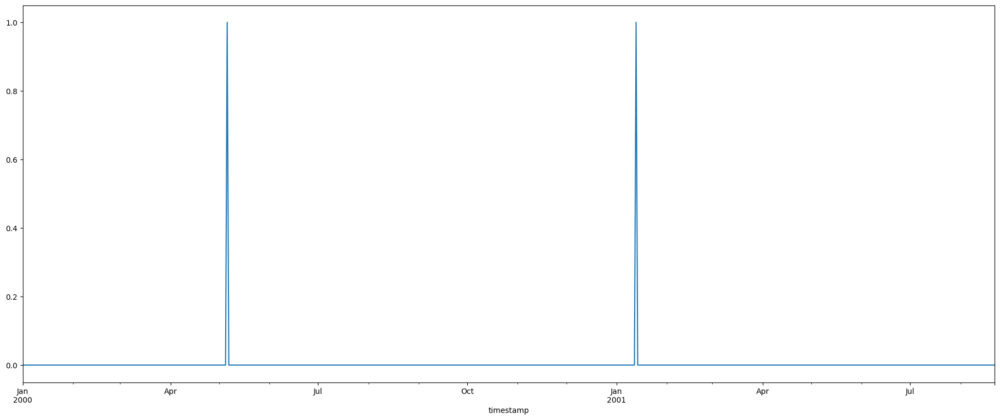

In [5]:
df_anomaly["segment_7"].plot()

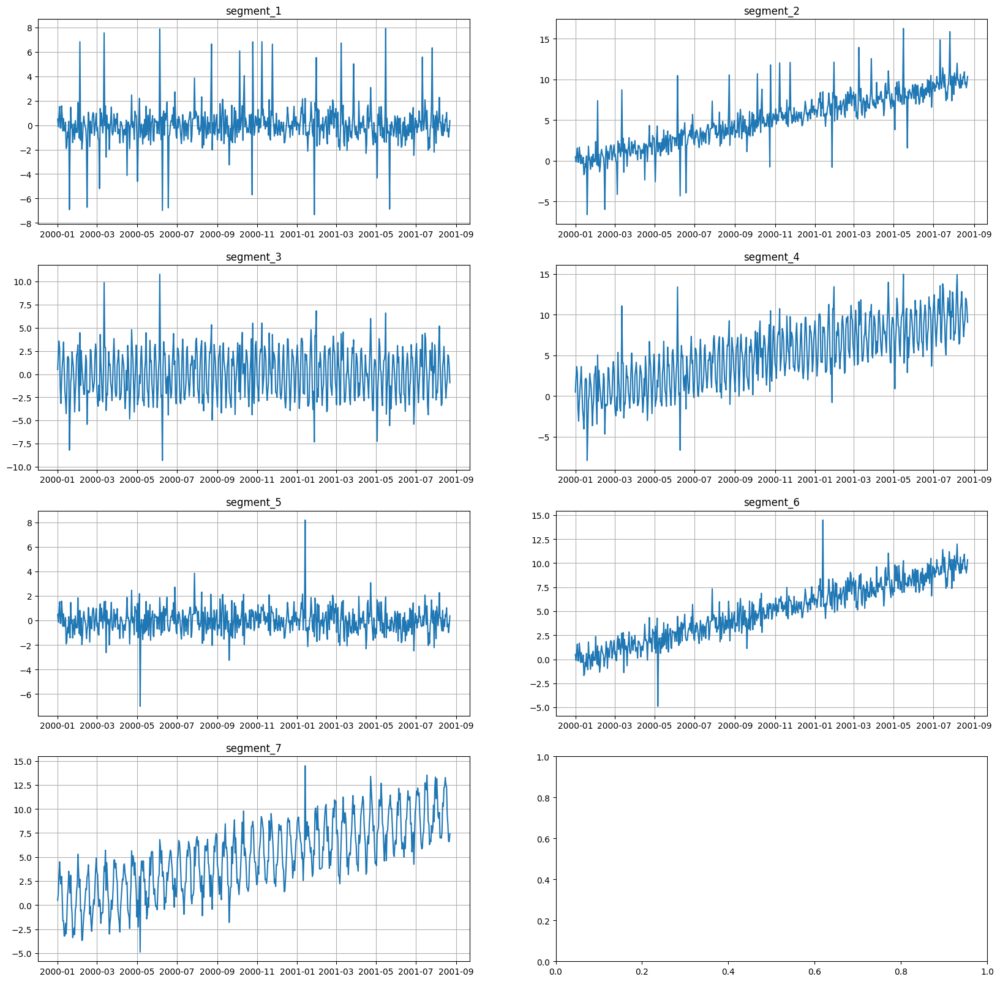

In [6]:
df_etna = convert_to_etna(df)
ts = TSDataset(df=df_etna, freq="D")
ts.plot()

In [7]:
df.reset_index().to_csv("data/data.csv", index=False)
df_anomaly.reset_index().to_csv("data/anomaly.csv", index=False)

## 2. Rule-Based подходы

Начнем с самых простых подходов

### 2.1 Global statistics
https://adtk.readthedocs.io/en/stable/notebooks/demo.html#

Идея: константные пороги на все время
- ThresholdAD -- нужен свой трешхолд под каждый ряд + фигово работает в случае нестационарности
- QuantileAD/InterQuartileRangeAD -- адаптивный трешхолд, однако все также плохо для тренда/сезонности

In [8]:
from adtk.detector import ThresholdAD, QuantileAD, InterQuartileRangeAD

{'precision': 0.10866058932244793, 'recall': 0.9340659340659341, 'f1_score': 0.1635521807001532}


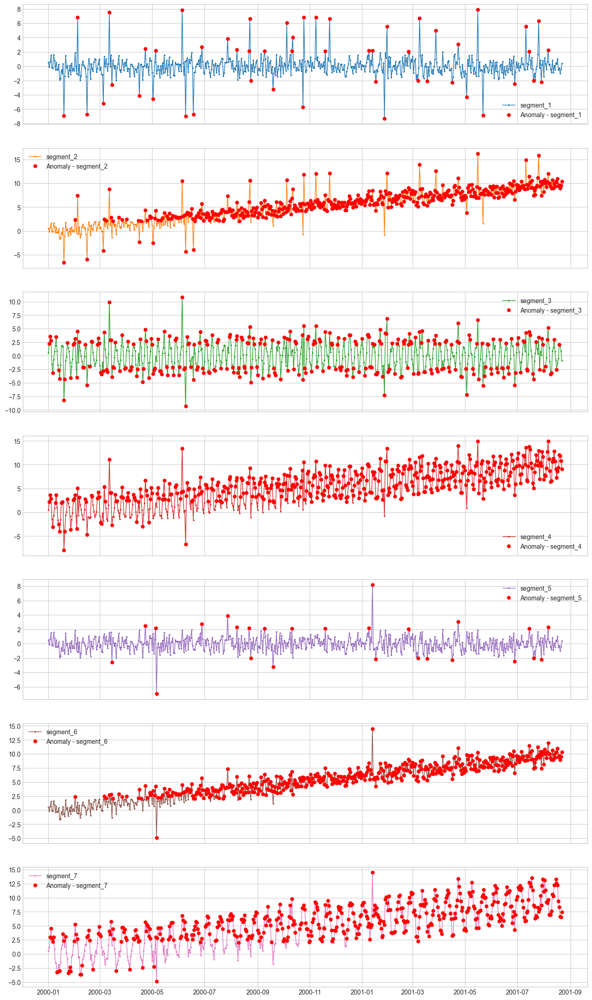

In [9]:
threshold_ad = ThresholdAD(low=-2, high=2)
metrics_thr, metrics_agg_thr, anomalies_thr = plot_anomalies(df, threshold_ad)

{'precision': 0.5595238095238094, 'recall': 0.6538461538461539, 'f1_score': 0.430719656283566}


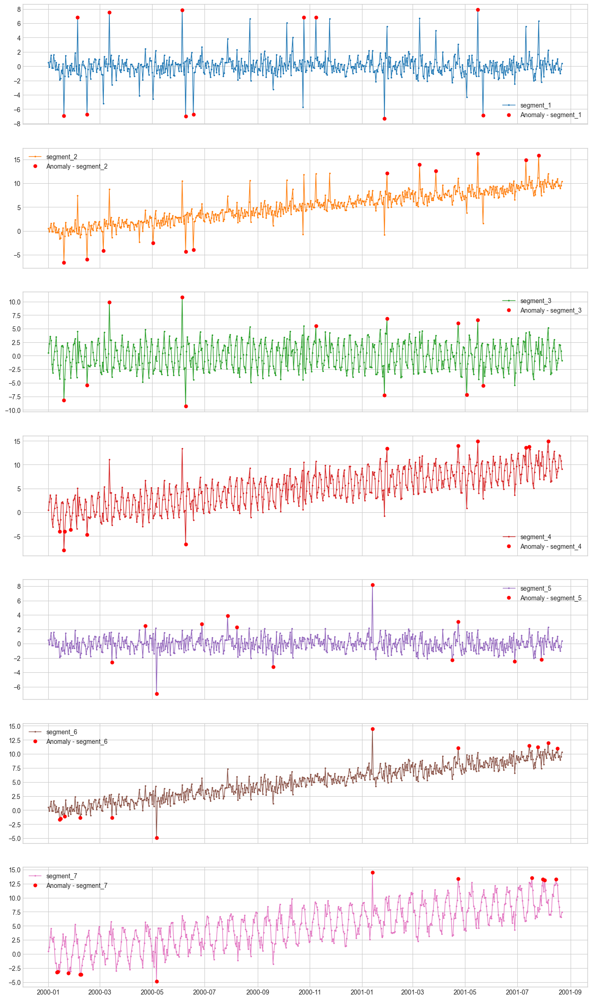

In [10]:
quantile_ad = QuantileAD(high=0.99, low=0.01)
metrics_qt, metrics_agg_qt, anomalies_qt = plot_anomalies(df, quantile_ad)

{'precision': 0.8666666666666667, 'recall': 0.40659340659340654, 'f1_score': 0.4519430760810071}


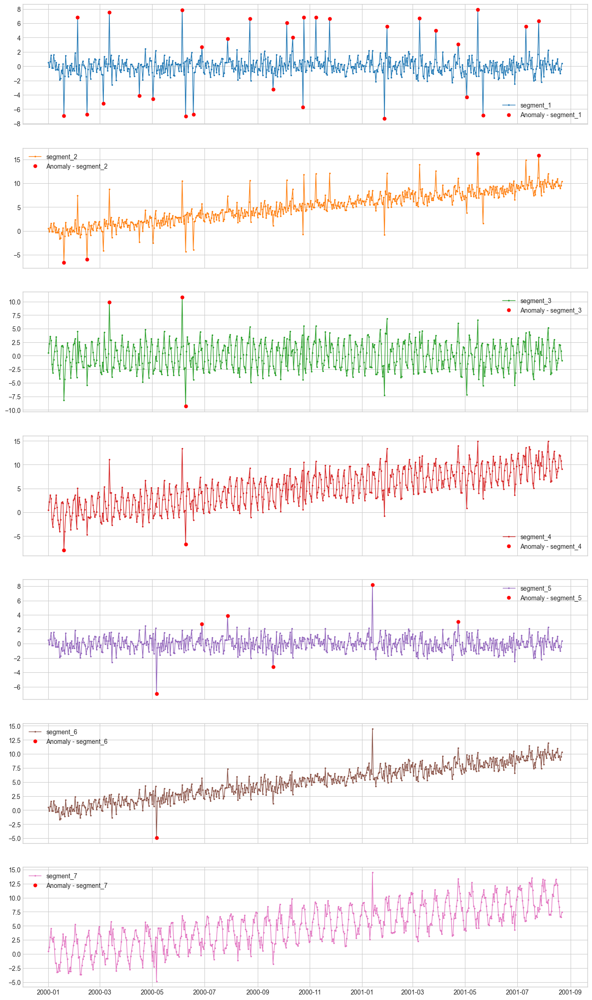

In [11]:
iqr_ad = InterQuartileRangeAD(c=1.5)
metrics_iqr, metrics_agg_iqr, anomalies_iqr = plot_anomalies(df, iqr_ad)

### 2.2 Sliding statistics

https://github.com/etna-team/etna/blob/master/examples/204-outliers.ipynb

Идея: пороги, зависящие от времени, строящиеся на статистиках в окне
- Гораздо лучше отрабатывают на нестационарных данных

In [12]:
from etna.analysis import get_anomalies_median, get_anomalies_density

{'precision': 0.880952380952381, 'recall': 0.7087912087912088, 'f1_score': 0.6917351232217993}


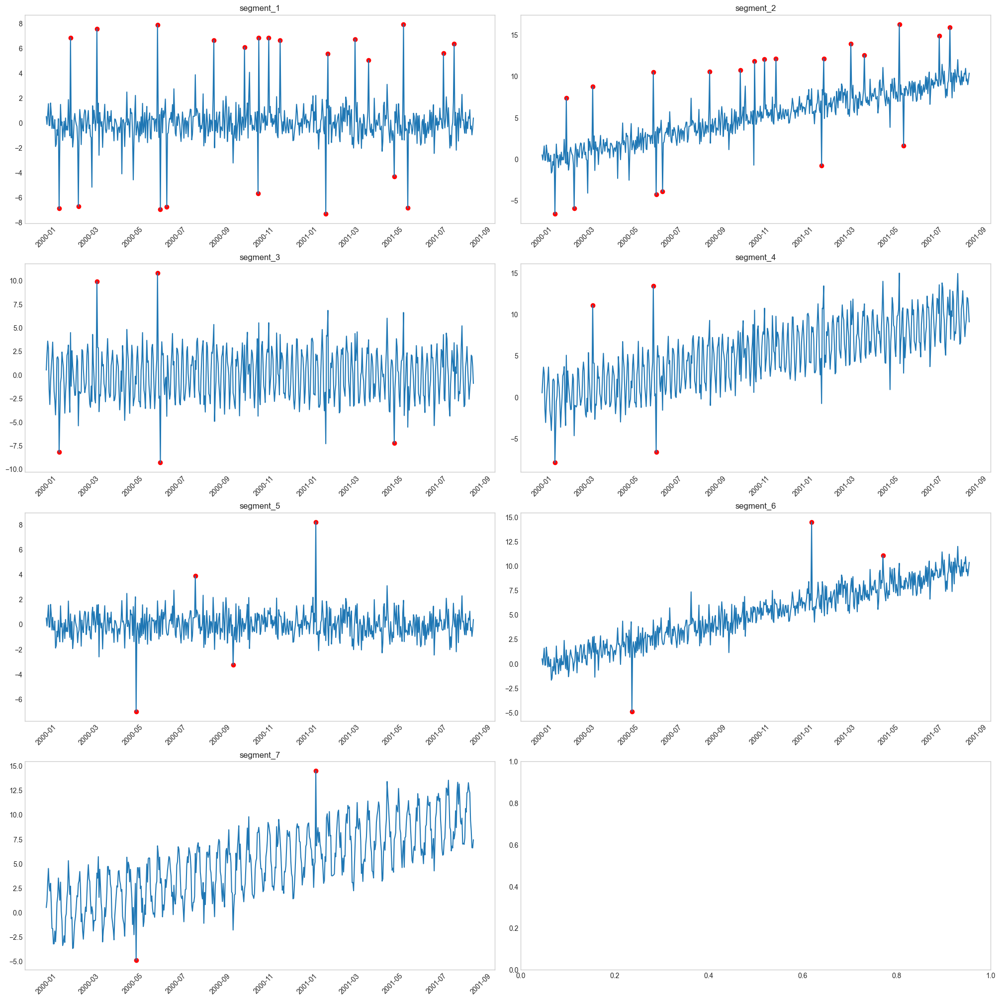

In [13]:
anomaly_dict = get_anomalies_median(ts, window_size=100)
metrics_med_100, metrics_agg_med_100, anomalies_med_100 = eval_etna(df, anomaly_dict)

{'precision': 0.888888888888889, 'recall': 0.5769230769230769, 'f1_score': 0.6037020450813555}


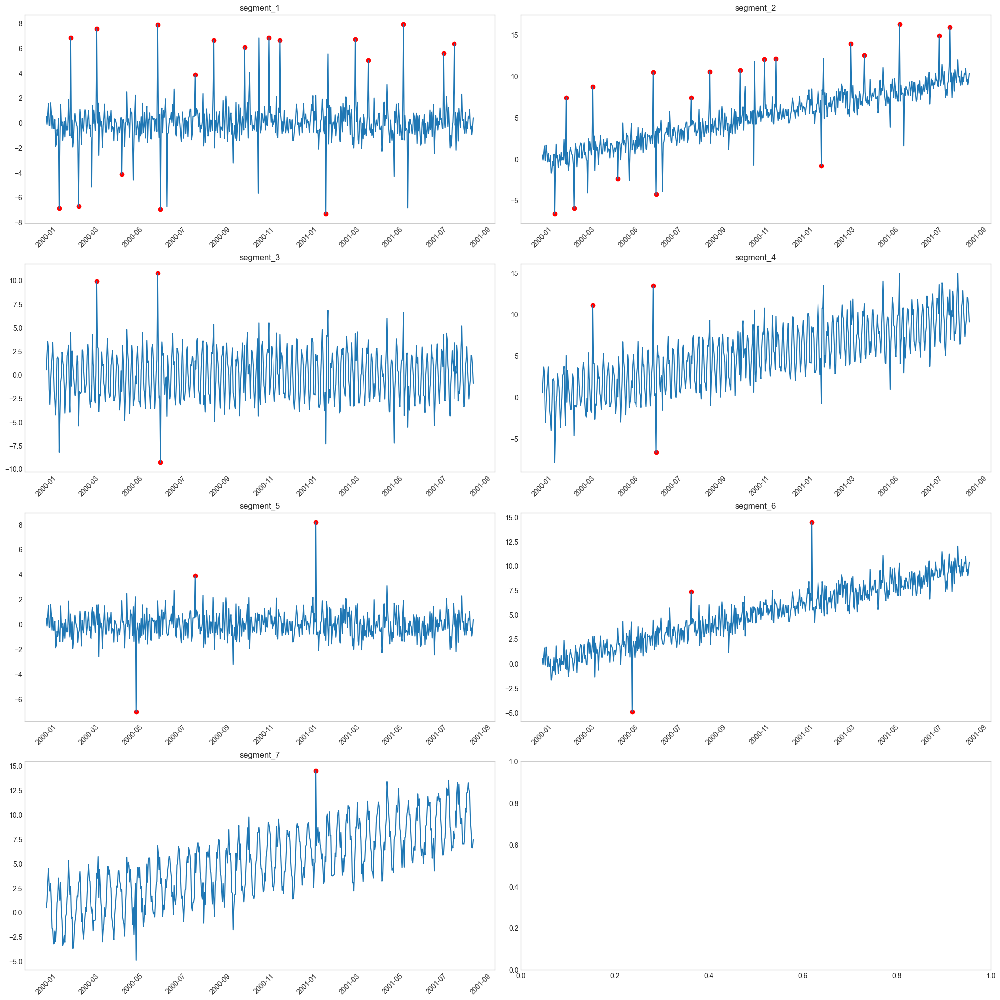

In [14]:
anomaly_dict = get_anomalies_median(ts, window_size=20)
metrics_med_20, metrics_agg_med_20, anomalies_med_20 = eval_etna(df, anomaly_dict)

{'precision': 0.7941666666666666, 'recall': 0.7197802197802198, 'f1_score': 0.6552037598517587}


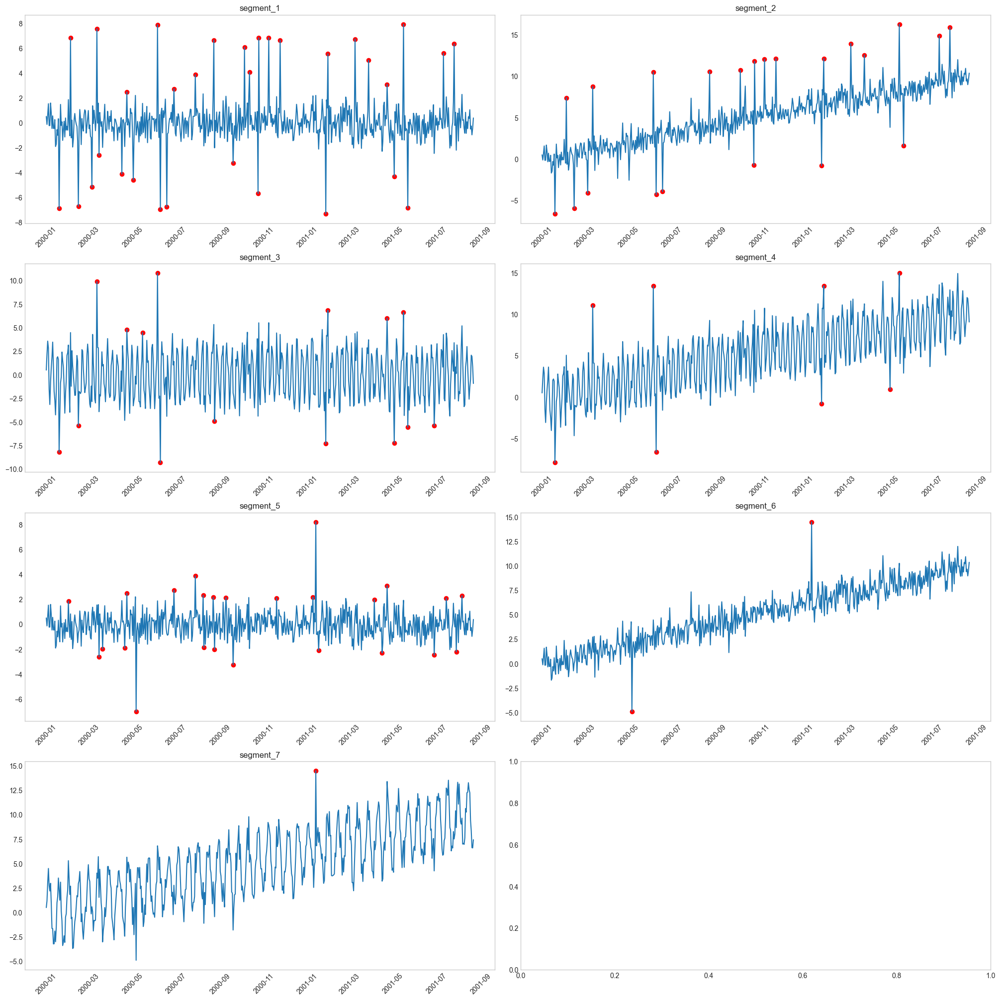

In [15]:
anomaly_dict = get_anomalies_density(ts, window_size=20, distance_coef=1, n_neighbors=4)
metrics_density, metrics_agg_density, anomalies_density = eval_etna(df, anomaly_dict)

### 2.3 Sliding statistics(интерактивная визуализация)

Идея: параметры для предразметки можно подбирать визуально

In [16]:
from etna.analysis import plot_anomalies_interactive

In [17]:
segment = "segment_1"
method = get_anomalies_median
params_bounds = {"window_size": (40, 70, 1), "alpha": (0.1, 4, 0.25)}
plot_anomalies_interactive(ts=ts, segment=segment, method=method, params_bounds=params_bounds)

interactive(children=(IntSlider(value=40, continuous_update=False, description='window_size', max=70, min=40, …

## 3. Forecasting Model

Следующий метод основан на использовании предсказательных моделей

Идея: если модель плохо предсказывает точку(точка выходит за доверительный интервал например), возможно она аномальная. Однако есть и другая альтернатива -- у вас просто плохая модель

### 3.1 Запуск метода

Будем искать аномалии с помощью модели Prophet
- Удалось найти все аномальные точки, при этом FP не так уж и много

In [18]:
from etna.analysis import get_anomalies_prediction_interval
from etna.models import ProphetModel

11:48:10 - cmdstanpy - INFO - Chain [1] start processing
11:48:10 - cmdstanpy - INFO - Chain [1] done processing
11:48:10 - cmdstanpy - INFO - Chain [1] start processing
11:48:10 - cmdstanpy - INFO - Chain [1] done processing
11:48:10 - cmdstanpy - INFO - Chain [1] start processing
11:48:10 - cmdstanpy - INFO - Chain [1] done processing
11:48:10 - cmdstanpy - INFO - Chain [1] start processing
11:48:10 - cmdstanpy - INFO - Chain [1] done processing
11:48:10 - cmdstanpy - INFO - Chain [1] start processing
11:48:10 - cmdstanpy - INFO - Chain [1] done processing
11:48:10 - cmdstanpy - INFO - Chain [1] start processing
11:48:10 - cmdstanpy - INFO - Chain [1] done processing
11:48:10 - cmdstanpy - INFO - Chain [1] start processing
11:48:10 - cmdstanpy - INFO - Chain [1] done processing


{'precision': 0.5933369483058925, 'recall': 1.0, 'f1_score': 0.6479099377212585}


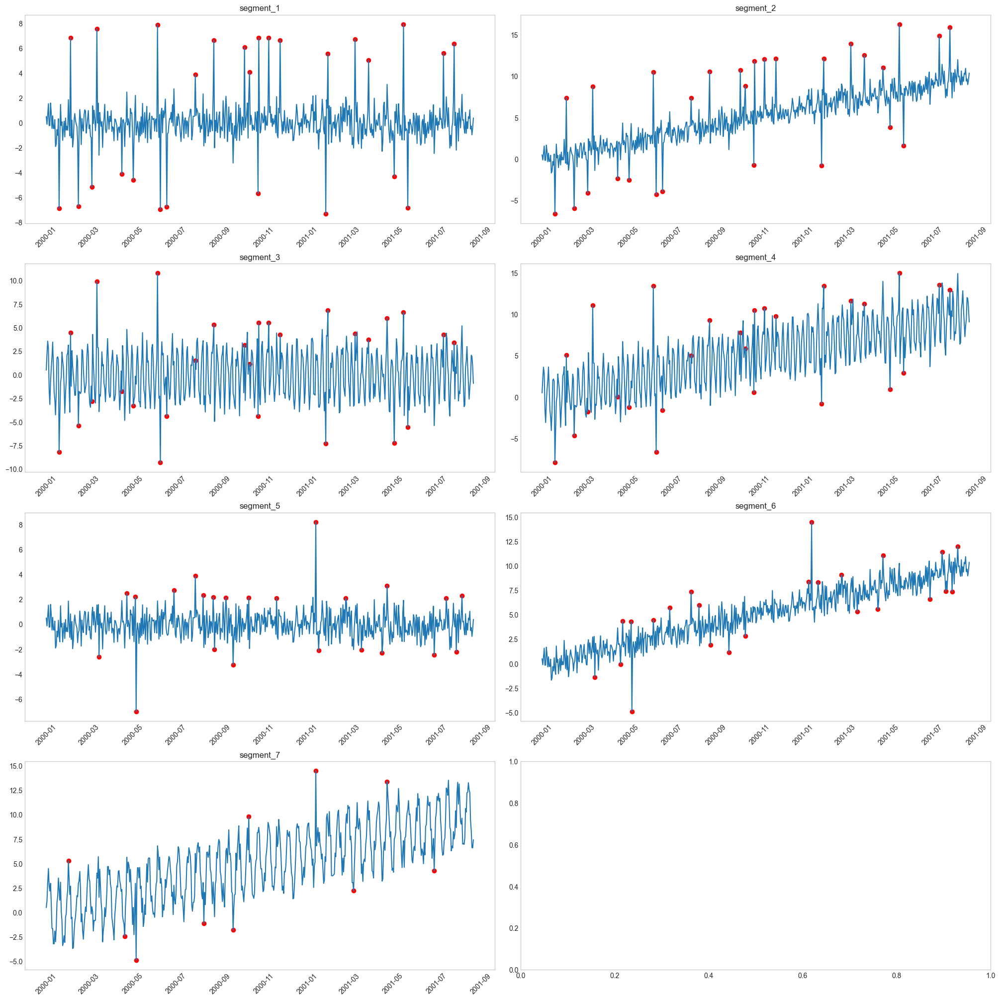

In [19]:
anomaly_dict = get_anomalies_prediction_interval(ts, model=ProphetModel, interval_width=0.95)
metrics_forecast, metrics_agg_forecast, anomalies_forecast = eval_etna(df, anomaly_dict)

### 3.2 Offline vs Online 

На лекции мы обсуждали что задачу поиска аномалий можно встретить в 2 постановках:
1. Offline -- когда изначально известны все данные, в рамках которых необходимо обнаружить аномалии
2. Online -- аномалии необходимо обноруживать в приходящем потоке данных



In [20]:
from etna.pipeline import Pipeline
from etna.analysis import plot_forecast

In [21]:
pipeline = Pipeline(model=ProphetModel(), transforms=[], horizon=72)
pipeline.fit(ts)

11:48:13 - cmdstanpy - INFO - Chain [1] start processing
11:48:13 - cmdstanpy - INFO - Chain [1] done processing
11:48:13 - cmdstanpy - INFO - Chain [1] start processing
11:48:13 - cmdstanpy - INFO - Chain [1] done processing
11:48:13 - cmdstanpy - INFO - Chain [1] start processing
11:48:13 - cmdstanpy - INFO - Chain [1] done processing
11:48:13 - cmdstanpy - INFO - Chain [1] start processing
11:48:13 - cmdstanpy - INFO - Chain [1] done processing
11:48:13 - cmdstanpy - INFO - Chain [1] start processing
11:48:13 - cmdstanpy - INFO - Chain [1] done processing
11:48:13 - cmdstanpy - INFO - Chain [1] start processing
11:48:13 - cmdstanpy - INFO - Chain [1] done processing
11:48:13 - cmdstanpy - INFO - Chain [1] start processing
11:48:13 - cmdstanpy - INFO - Chain [1] done processing


Pipeline(model = ProphetModel(growth = 'linear', changepoints = None, n_changepoints = 25, changepoint_range = 0.8, yearly_seasonality = 'auto', weekly_seasonality = 'auto', daily_seasonality = 'auto', holidays = None, seasonality_mode = 'additive', seasonality_prior_scale = 10.0, holidays_prior_scale = 10.0, changepoint_prior_scale = 0.05, mcmc_samples = 0, interval_width = 0.8, uncertainty_samples = 1000, stan_backend = None, additional_seasonality_params = (), timestamp_column = None, ), transforms = [], horizon = 72, )

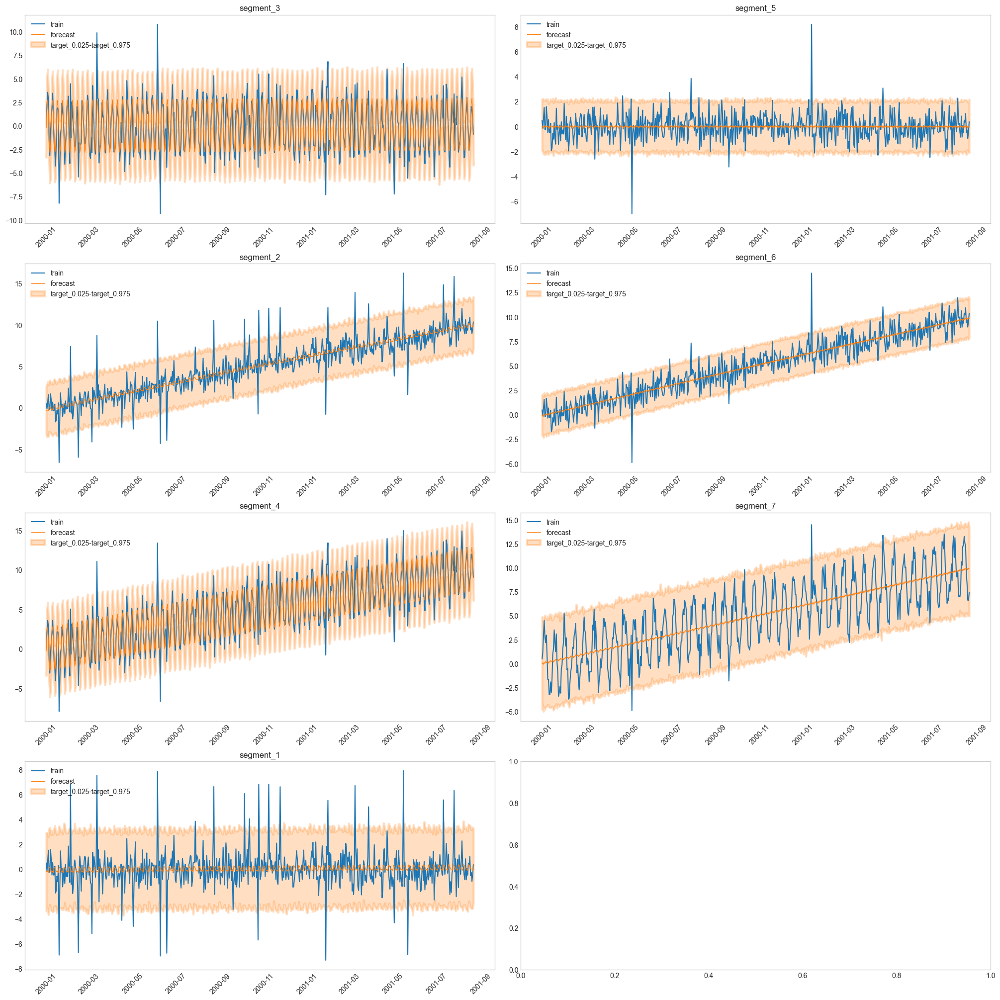

In [22]:
# Offline
forecast = pipeline.predict(ts, prediction_interval=True)
plot_forecast(forecast_ts=forecast, train_ts=ts, prediction_intervals=True)

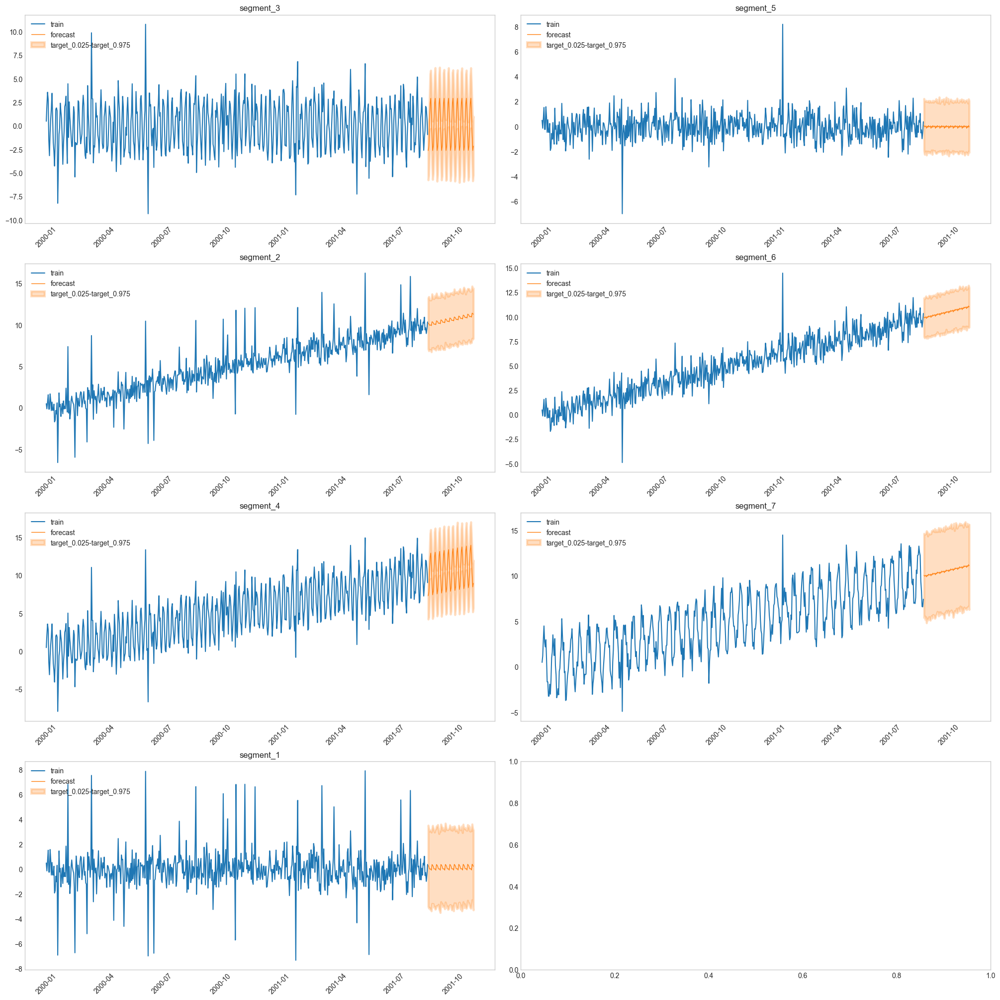

In [23]:
# Online
forecast = pipeline.forecast(prediction_interval=True)
plot_forecast(forecast_ts=forecast, train_ts=ts, prediction_intervals=True)

## 4. Сведение к табличкам

Следующая идея это сведение к табличным данным -- там уже придумано куча методов

### 4.1 AutoEncoder

Построим простейший автоэнкодер, в качестве признаков для точки будем использовать лаги

In [24]:
from pyod.models.auto_encoder import AutoEncoder

N_LAGS = 14

In [25]:
anomalies_autoencoder = df_anomaly.copy()
anomalies_autoencoder_prob = df_anomaly.copy()

for target in df.columns:
    # Построим признаки
    X, y = df[[target]], df_anomaly[target]
    for i in range(1, N_LAGS + 1):
        X[f"lag_{i}"] = X[target].shift(i)
    X = X.dropna()

    # Обучим модель
    clf = AutoEncoder()
    clf.fit(X)

    # Выберем аномальные точки
    anomalies_autoencoder[target] = (
        [
            0 for _ in range(1, N_LAGS + 1)
        ]  # Для первых точечк ряда известны не все признаки, поэтому там скор аномальности мы оценить не можем
        + list(clf.predict(X))
    )
    anomalies_autoencoder_prob[target] = (
        [
            0 for _ in range(1, N_LAGS + 1)
        ]  # Для первых точечк ряда известны не все признаки, поэтому там скор аномальности мы оценить не можем
        + list(clf.predict_proba(X)[:, 1])
    )

Training: 100%|█████████████████████████████████| 10/10 [00:00<00:00, 47.03it/s]


{'precision': 0.09200968523002422, 'recall': 0.6043956043956044, 'f1_score': 0.13566606970657114}


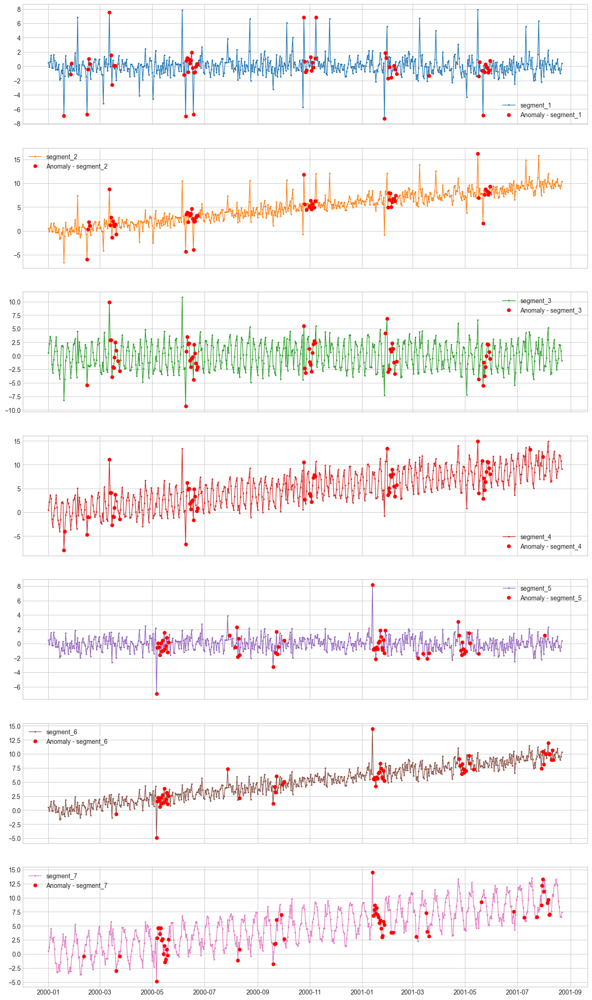

In [26]:
metrics, metrics_agg_autoencoder = eval_metrics(
    df_anomaly, anomalies_autoencoder, metrics_list=[precision, recall, f1_score]
)
plot(
    df,
    anomaly=anomalies_autoencoder,
    ts_linewidth=1,
    ts_markersize=3,
    anomaly_markersize=5,
    anomaly_color="red",
    anomaly_tag="marker",
)
print(metrics_agg_autoencoder)

<Axes: xlabel='timestamp'>

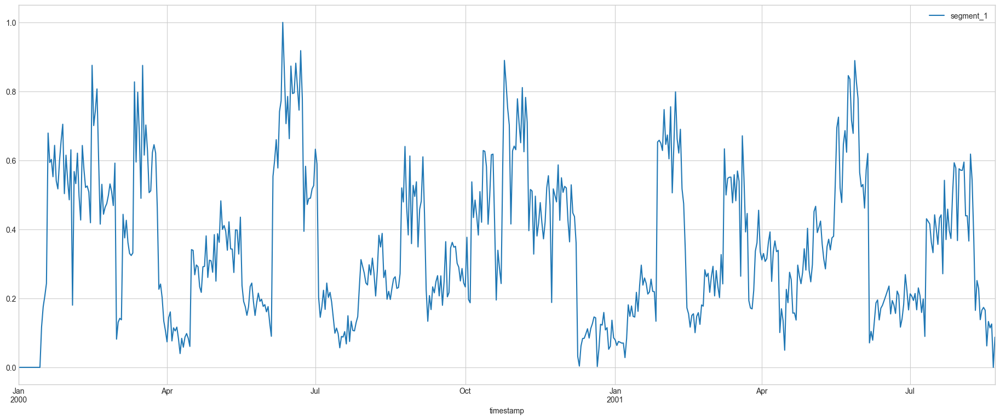

In [27]:
anomalies_autoencoder_prob.plot(y="segment_1")

<Axes: xlabel='timestamp'>

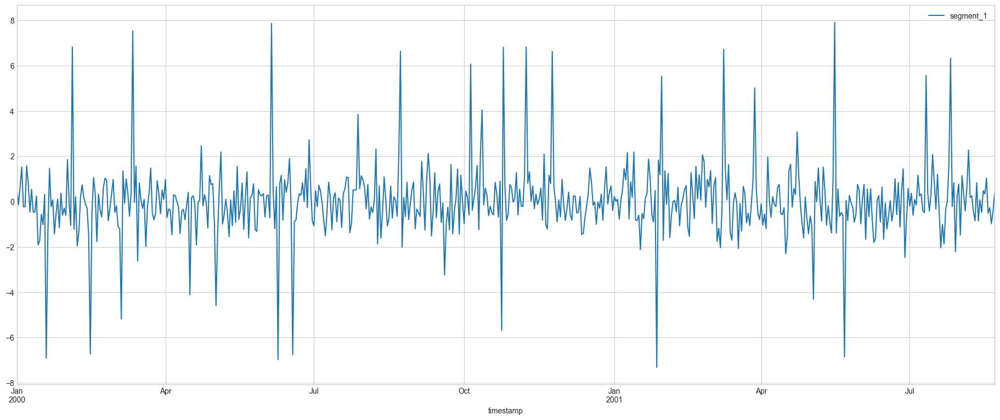

In [28]:
df.plot(y="segment_1")

### 4.2 Isolation Forest 

На семинаре построим базовую версию IF, которая ищет аномалии на 1 признаке -- таргете. В таком случае мы получаем 1d решающие поверхности -- по картинкам видно что этого не достаточно

В качестве ДЗ предлагается попробовать улучшить ситуацию и добавить дургие признаки

In [29]:
from etna.analysis import get_anomalies_isolation_forest

{'precision': 0.14916286430712086, 'recall': 0.8901098901098902, 'f1_score': 0.22967784999040744}


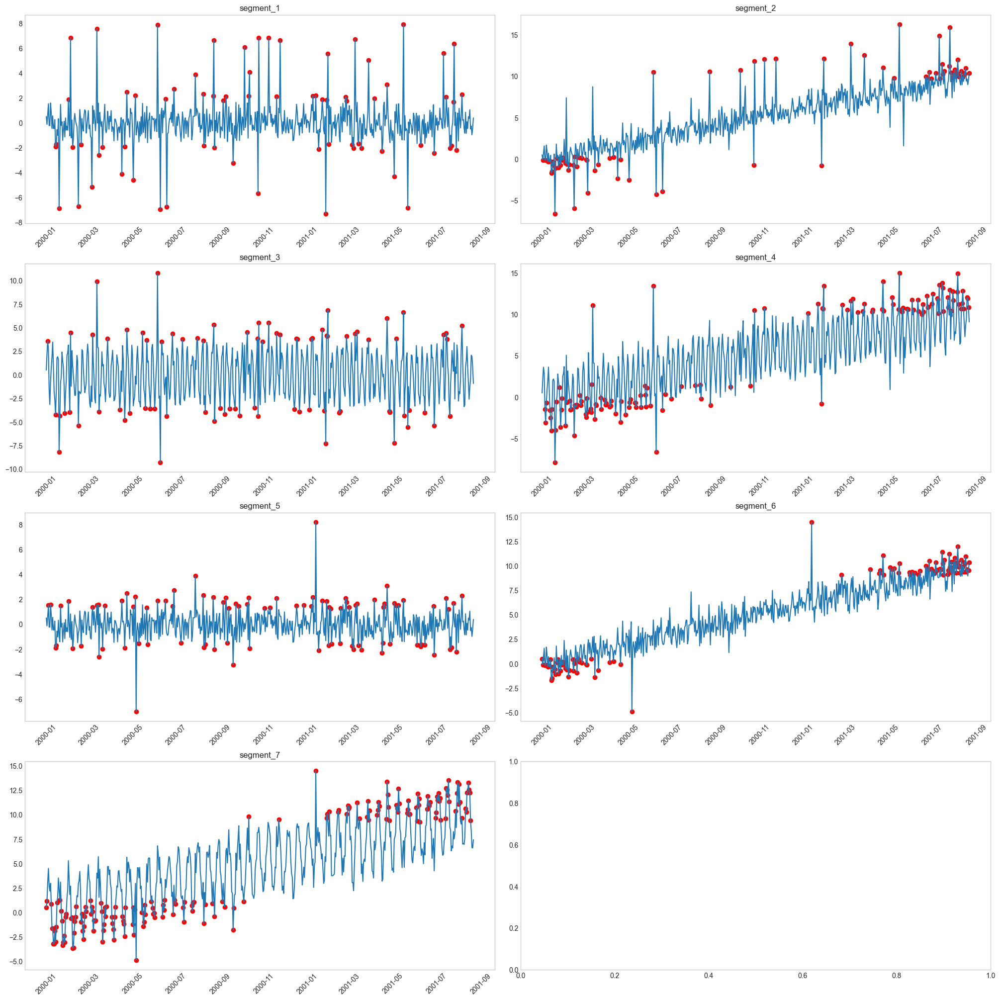

In [30]:
anomaly_dict = get_anomalies_isolation_forest(ts)
metrics_if, metrics_agg_if, anomalies_if = eval_etna(df, anomaly_dict)

## 4.1 AutoEncoder

In [31]:
from pyod.models.auto_encoder import AutoEncoder

In [32]:
anomalies_autoencoder = df_anomaly.copy()
for target in df.columns:
    X, y = df[[target]], df_anomaly[target]
    for i in range(1, 15):
        X[f"lag_{i}"] = X[target].shift(i)
    clf = clf = AutoEncoder()
    clf.fit(X.dropna())
    anomalies_autoencoder[target] = [0 for _ in range(1, 15)] + list(clf.predict(X.dropna()))

Training: 100%|█████████████████████████████████| 10/10 [00:00<00:00, 44.17it/s]


{'precision': 0.09200968523002422, 'recall': 0.6043956043956044, 'f1_score': 0.13566606970657114}


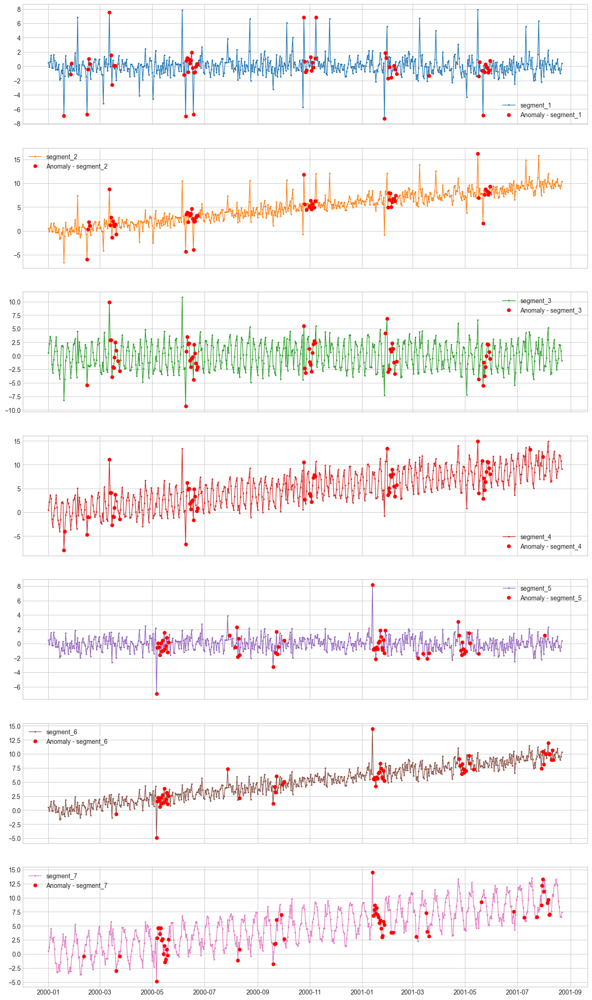

In [33]:
metrics, metrics_agg_autoencoder = eval_metrics(
    df_anomaly, anomalies_autoencoder, metrics_list=[precision, recall, f1_score]
)
plot(
    df,
    anomaly=anomalies_autoencoder,
    ts_linewidth=1,
    ts_markersize=3,
    anomaly_markersize=5,
    anomaly_color="red",
    anomaly_tag="marker",
)
print(metrics_agg_autoencoder)

## 4.2 Isolation Forest

In [34]:
from etna.analysis import get_anomalies_isolation_forest

{'precision': 0.14916286430712086, 'recall': 0.8901098901098902, 'f1_score': 0.22967784999040744}


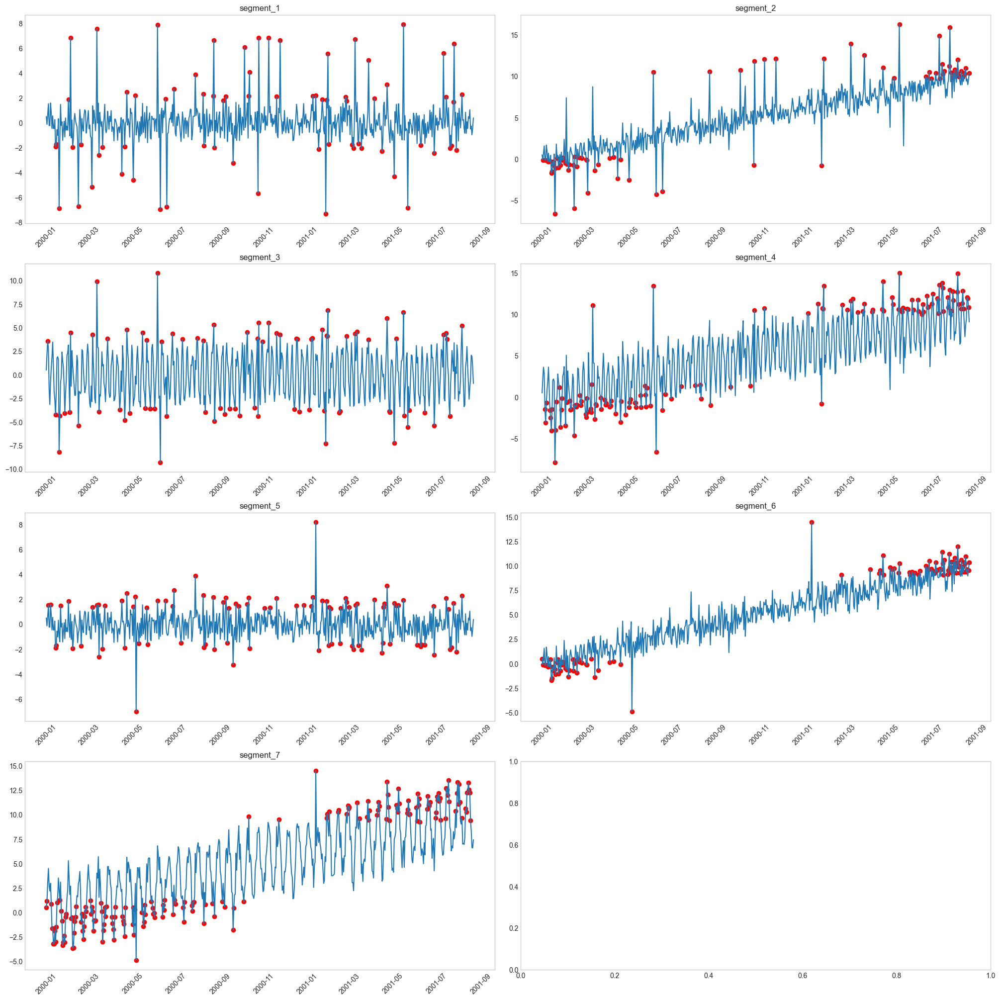

In [35]:
anomaly_dict = get_anomalies_isolation_forest(ts)
metrics_if, metrics_agg_if, anomalies_if = eval_etna(df, anomaly_dict)

In [36]:
from etna.transforms import LinearTrendTransform

In [37]:
trend_transform = LinearTrendTransform(in_column="target")
ts.fit_transform([trend_transform])

{'precision': 0.19130637503532447, 'recall': 0.9285714285714286, 'f1_score': 0.2854236041779998}


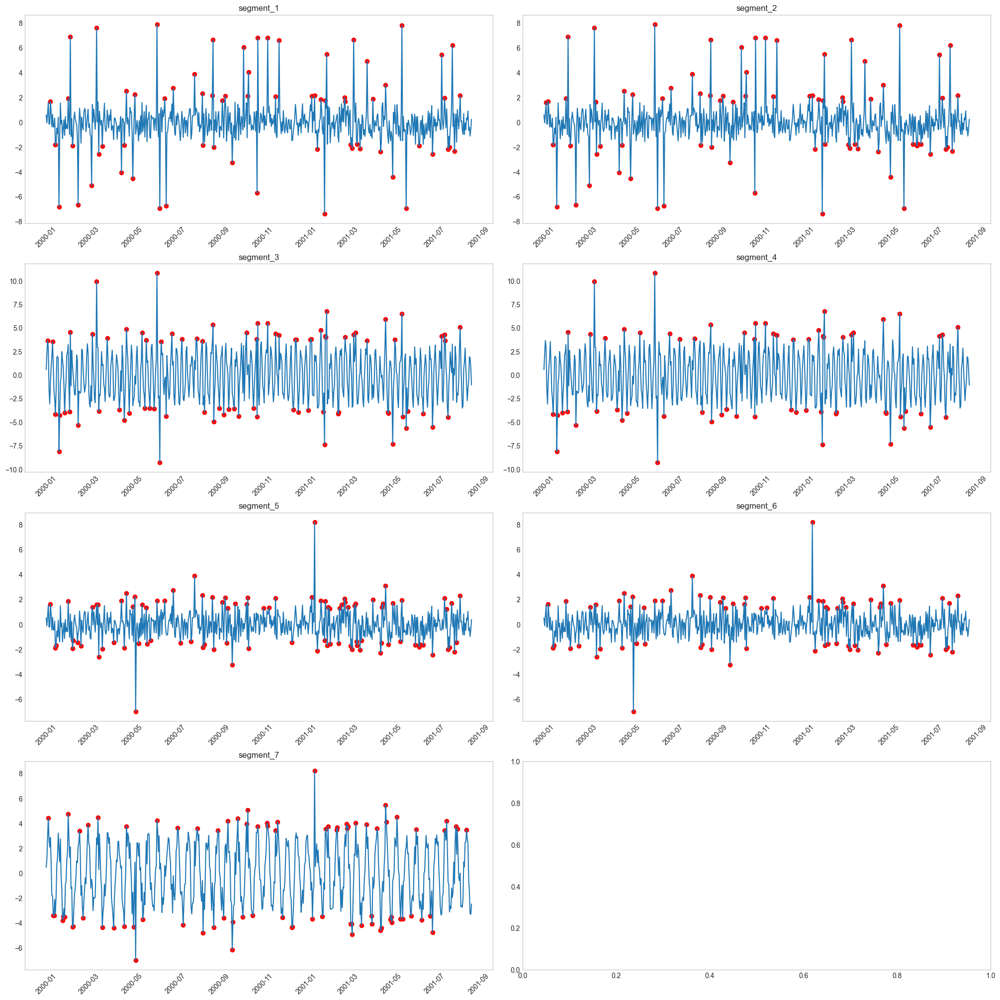

In [38]:
anomaly_dict = get_anomalies_isolation_forest(ts, features_to_use=["target"])
metrics_if_det, metrics_agg_if_det, anomalies_if_det = eval_etna(df, anomaly_dict)

In [39]:
ts.inverse_transform([trend_transform])

## 5. Ensembling

Бывает полезно смешать ответы нескольких методов

In [40]:
from adtk.aggregator import OrAggregator, AndAggregator

In [41]:
anomalies = [
    anomalies_autoencoder,
    anomalies_if,
    anomalies_forecast,
    anomalies_thr,
    anomalies_qt,
    anomalies_iqr,
    anomalies_med_100,
    anomalies_med_20,
    anomalies_density,
]
metrics = [
    metrics_agg_autoencoder,
    metrics_agg_if,
    metrics_agg_forecast,
    metrics_agg_thr,
    metrics_agg_qt,
    metrics_agg_iqr,
    metrics_agg_med_100,
    metrics_agg_med_20,
    metrics_agg_density,
]
names = ["anomalies_autoencoder", "if", "if_det", "forecast", "thr", "qt", "iqr", "med_100", "med_20", "density"]

In [42]:
anomalies_thr_or = df.copy()
for target in df.columns:
    anomaly = {name: anomaly[target] for name, anomaly in zip(names, anomalies)}
    anomalies_thr_or[target] = OrAggregator().aggregate(anomaly)

{'precision': 0.05992708398499873, 'recall': 1.0, 'f1_score': 0.1053504707857716}


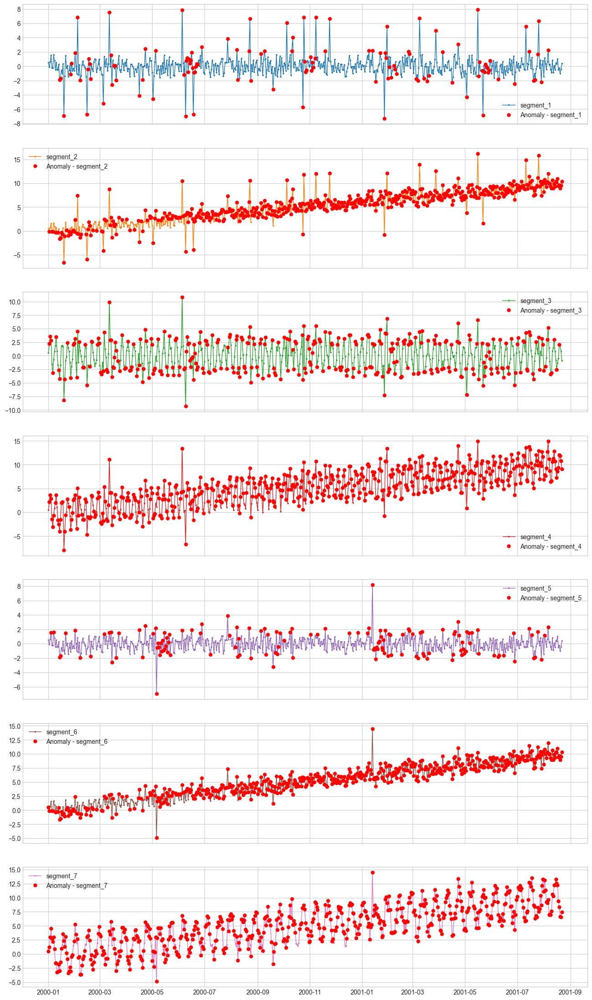

In [43]:
metrics, metrics_agg_or = eval_metrics(df_anomaly, anomalies_thr_or, metrics_list=[precision, recall, f1_score])
plot(
    df,
    anomaly=anomalies_thr_or,
    ts_linewidth=1,
    ts_markersize=3,
    anomaly_markersize=5,
    anomaly_color="red",
    anomaly_tag="marker",
)
print(metrics_agg_or)

In [44]:
anomalies_thr_and = df.copy()
for target in df.columns:
    anomaly = {name: anomaly[target] for name, anomaly in zip(names, anomalies)}
    anomalies_thr_and[target] = AndAggregator().aggregate(anomaly)

{'precision': 1.0, 'recall': 0.27472527472527475, 'f1_score': 0.4002425044091711}


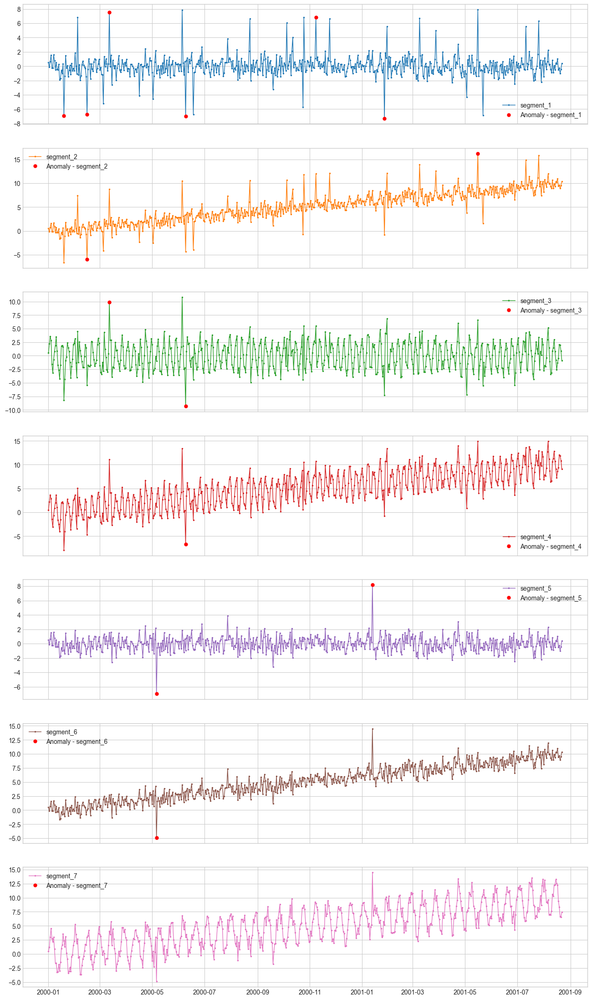

In [45]:
metrics, metrics_agg_and = eval_metrics(df_anomaly, anomalies_thr_and, metrics_list=[precision, recall, f1_score])
plot(
    df,
    anomaly=anomalies_thr_and,
    ts_linewidth=1,
    ts_markersize=3,
    anomaly_markersize=5,
    anomaly_color="red",
    anomaly_tag="marker",
)
print(metrics_agg_and)

## 6. All-in-all

Теперь посмотрим на итогововые результаты и выберем лучше методы для наших данных по разным метрикам

In [46]:
anomalies = [
    anomalies_autoencoder,
    anomalies_if,
    anomalies_forecast,
    anomalies_thr,
    anomalies_qt,
    anomalies_iqr,
    anomalies_med_100,
    anomalies_med_20,
    anomalies_density,
]
metrics = [
    metrics_agg_autoencoder,
    metrics_agg_if,
    metrics_agg_forecast,
    metrics_agg_thr,
    metrics_agg_qt,
    metrics_agg_iqr,
    metrics_agg_med_100,
    metrics_agg_med_20,
    metrics_agg_density,
]
names = ["autoencoder", "if", "forecast", "thr", "qt", "iqr", "med_100", "med_20", "density"]

metrics += [metrics_agg_or, metrics_agg_and]
names += ["or", "and"]

pd.DataFrame(metrics, index=names).sort_values("f1_score", ascending=False)

,precision,recall,f1_score
med_100,0.880952,0.708791,0.691735
density,0.794167,0.719780,0.655204
forecast,0.593337,1.000000,0.647910
med_20,0.888889,0.576923,0.603702
iqr,0.866667,0.406593,0.451943
qt,0.559524,0.653846,0.430720
and,1.000000,0.274725,0.400243
if,0.149163,0.890110,0.229678
thr,0.108661,0.934066,0.163552
autoencoder,0.092010,0.604396,0.135666


In [47]:
pd.DataFrame(metrics, index=names).sort_values("recall", ascending=False)

,precision,recall,f1_score
forecast,0.593337,1.000000,0.647910
or,0.059927,1.000000,0.105350
thr,0.108661,0.934066,0.163552
if,0.149163,0.890110,0.229678
density,0.794167,0.719780,0.655204
med_100,0.880952,0.708791,0.691735
qt,0.559524,0.653846,0.430720
autoencoder,0.092010,0.604396,0.135666
med_20,0.888889,0.576923,0.603702
iqr,0.866667,0.406593,0.451943


In [48]:
pd.DataFrame(metrics, index=names).sort_values("precision", ascending=False)

,precision,recall,f1_score
and,1.000000,0.274725,0.400243
med_20,0.888889,0.576923,0.603702
med_100,0.880952,0.708791,0.691735
iqr,0.866667,0.406593,0.451943
density,0.794167,0.719780,0.655204
forecast,0.593337,1.000000,0.647910
qt,0.559524,0.653846,0.430720
if,0.149163,0.890110,0.229678
thr,0.108661,0.934066,0.163552
autoencoder,0.092010,0.604396,0.135666


# Точки смены поведения

Кратко рассмтотрим варианты для онаружения точек смены поведения

## 1. Ruptures

[ruptures](https://centre-borelli.github.io/ruptures-docs/) -- библиотека для обнаружения точек смены поведения, все методы в ней состоят из двух компонент
1. Cost function -- она определяет характер ихменения поведения
2. Search method -- стратегия поиска точек

Также стратегия поиска точек позволяет искать как конкретное количество(n_bkps), так и задавать некоторый критерий остановки поиска 

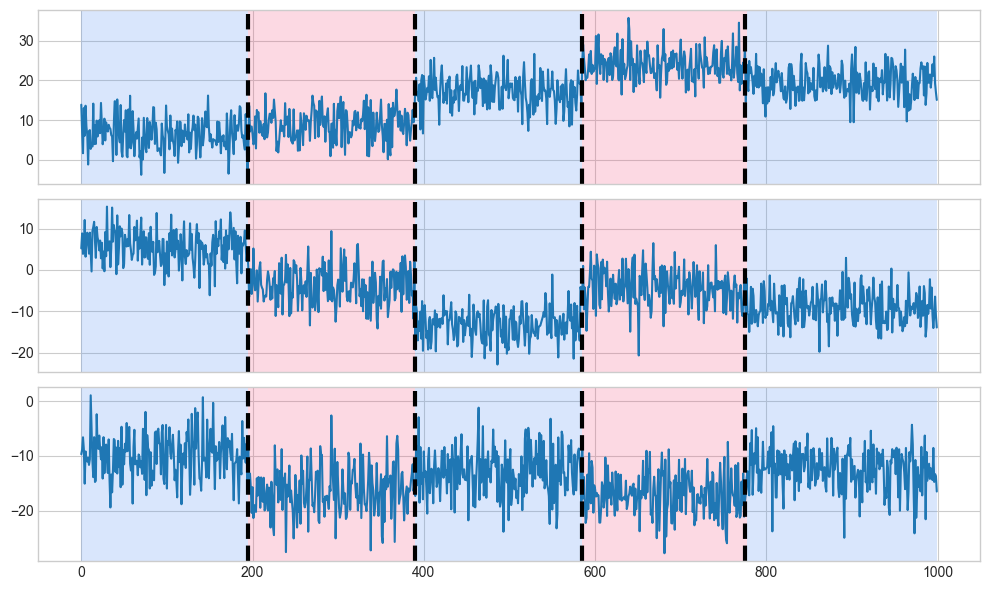

In [49]:
import matplotlib.pyplot as plt
import ruptures as rpt

n_samples, dim, sigma = 1000, 3, 4
n_bkps = 4
signal, bkps = rpt.pw_constant(n_samples, dim, n_bkps, noise_std=sigma)

model = "l2"  # cost function -- "l1", "rbf", "linear", "normal", "ar",...
algo = rpt.Binseg(model=model).fit(signal)  # search method
result = algo.predict(n_bkps=n_bkps)

rpt.display(
    signal,
    bkps,
    result,  # Вертикальные черты
)
plt.show()

Тут не указываем точное количетсво точек

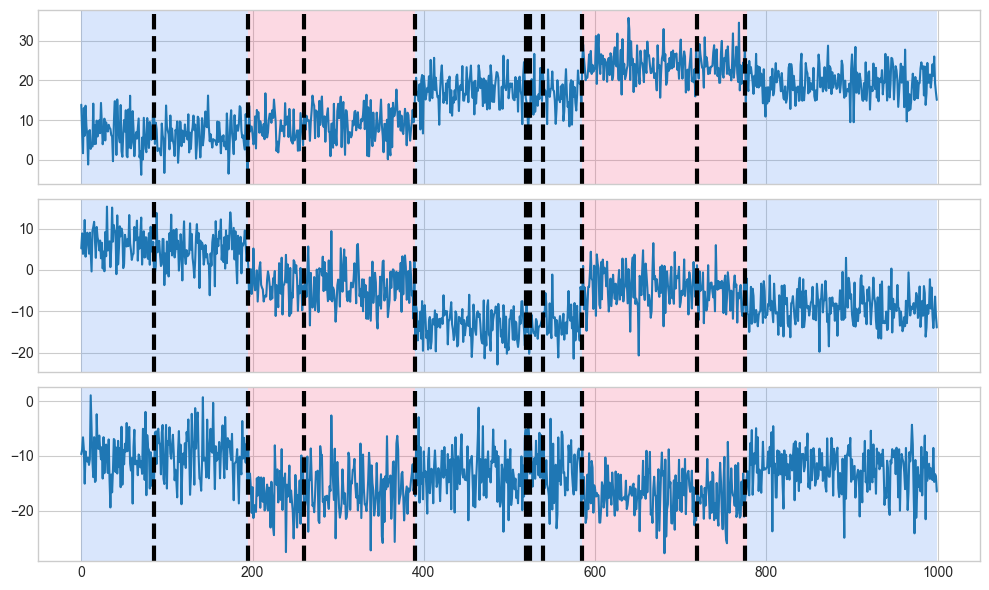

In [50]:
result = algo.predict(pen=100)

rpt.display(signal, bkps, result)
plt.show()

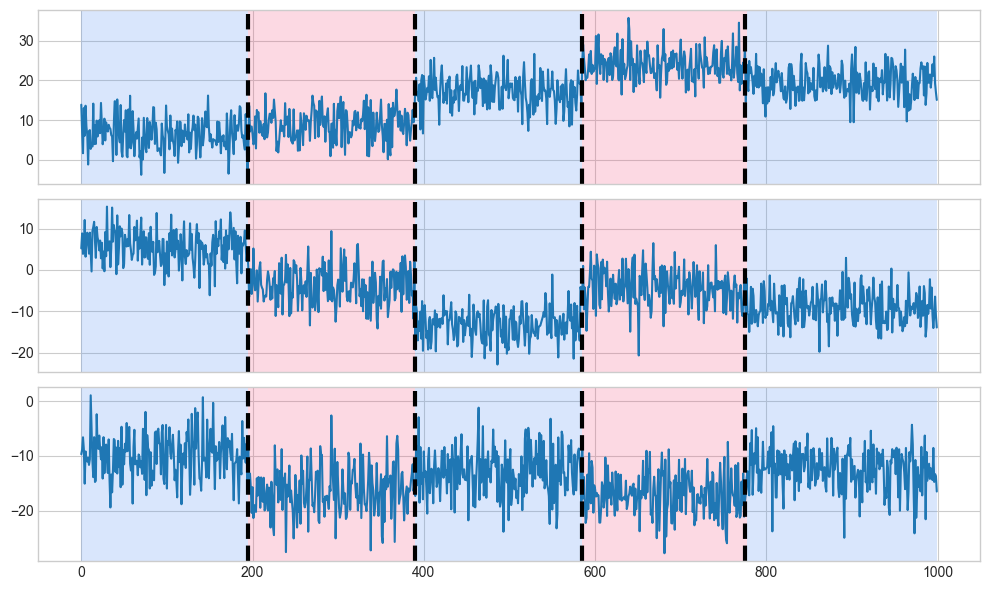

In [51]:
result = algo.predict(pen=1000)

rpt.display(signal, bkps, result)
plt.show()

## 2. Скользящие статистики

Основная идея: проходимся по ряду скользящим окошком и для центральной точки подсчитываем discrepancy function 

In [52]:
from adtk.detector import LevelShiftAD

In [53]:
df_seg = pd.DataFrame(
    {
        "timestamp": pd.date_range(start="2000-01-01", freq="D", periods=signal.shape[0]),
        "segment_1": signal[:, 0],
        "segment_2": signal[:, 1],
        "segment_3": signal[:, 2],
    }
)
df_seg = df_seg.set_index("timestamp")

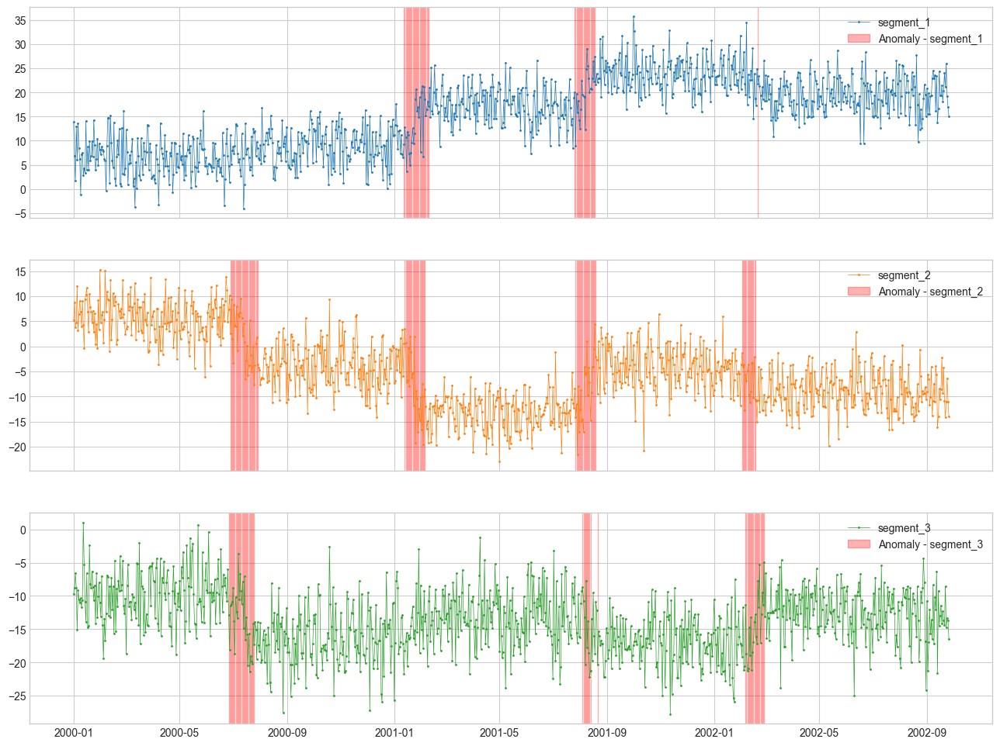

In [54]:
level_shift_ad = LevelShiftAD(c=2.0, side="both", window=30)
anomalies = level_shift_ad.fit_detect(df_seg)

pd.Series.iteritems = pd.Series.items
plot(df_seg, anomaly=anomalies, anomaly_color="red");

## 3.3 Prophet

https://facebook.github.io/prophet/docs/trend_changepoints.html#automatic-changepoint-detection-in-prophet

Поиск точек смены поведения с помощью модели Prophet мы разбирали еще на первой лекции, тут стратегия такая:
1. Разрабсываем равномерно n_changepoints по первым changepoint_range точкам ряда
2. Обучаем модель с априорным распределением Лапласа для коэффициентов для каждой точки (аля Lasso регрессия)
3. Точки, для которых не занулились коэффициенты и есть точки смены поведения

Через changepoint_prior_scale можно управлять консервативностью выбора количества значимых точек

In [55]:
df_prophet = df_seg["segment_1"].reset_index().rename(columns={"timestamp": "ds", "segment_1": "y"})
df_prophet.head()

,ds,y
0,2000-01-01,13.880549
1,2000-01-02,6.887007
2,2000-01-03,1.691938
3,2000-01-04,13.040735
4,2000-01-05,6.093320


11:48:31 - cmdstanpy - INFO - Chain [1] start processing
11:48:31 - cmdstanpy - INFO - Chain [1] done processing


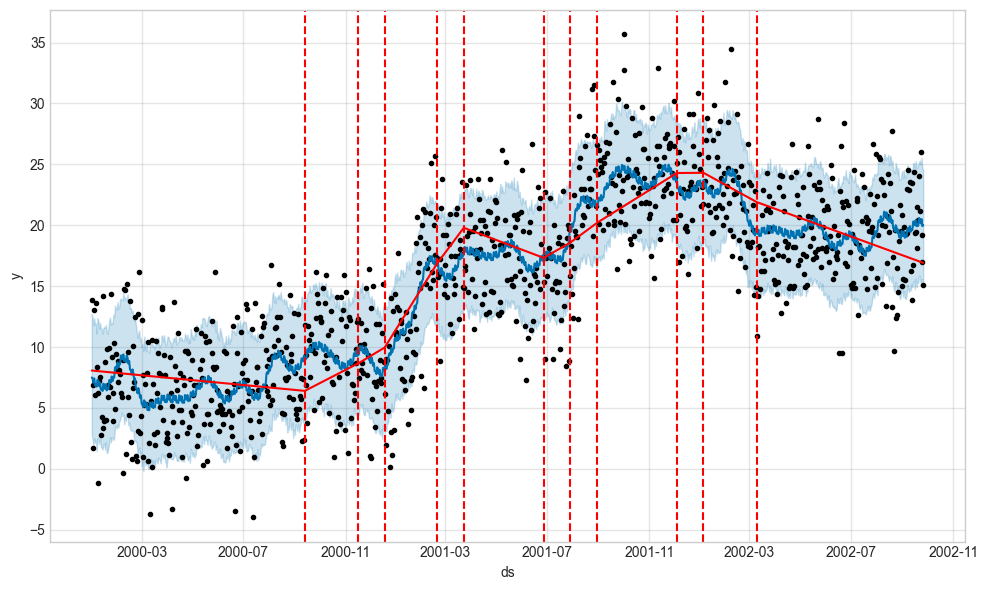

In [56]:
from prophet import Prophet
from prophet.plot import add_changepoints_to_plot

m = Prophet(n_changepoints=25, changepoint_range=0.8, changepoint_prior_scale=0.5)
forecast = m.fit(df_prophet).predict(df_prophet)

fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

11:48:31 - cmdstanpy - INFO - Chain [1] start processing
11:48:31 - cmdstanpy - INFO - Chain [1] done processing


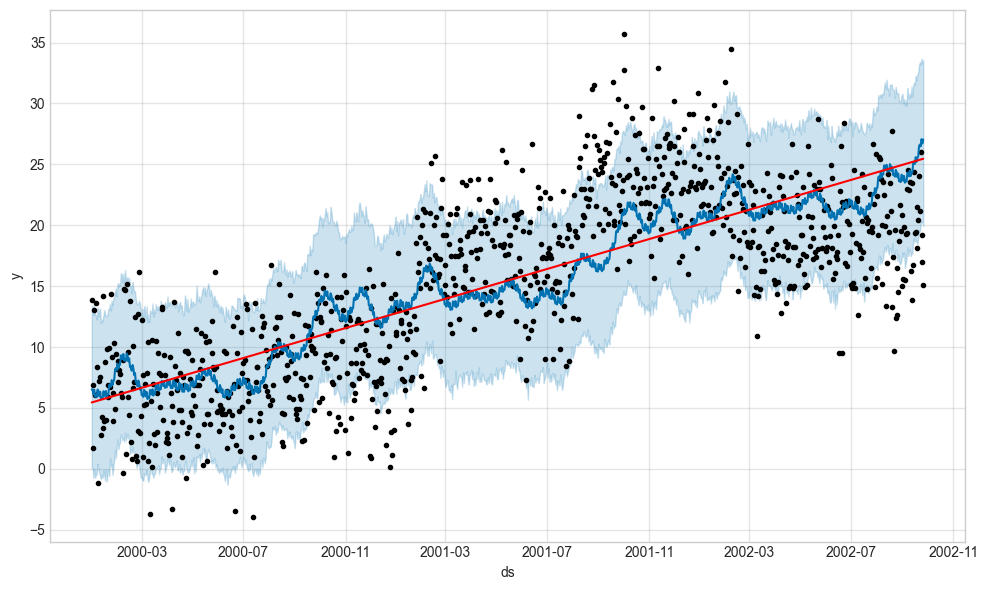

In [57]:
m = Prophet(n_changepoints=25, changepoint_range=0.8, changepoint_prior_scale=0.001)
forecast = m.fit(df_prophet).predict(df_prophet)

fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

11:48:31 - cmdstanpy - INFO - Chain [1] start processing
11:48:32 - cmdstanpy - INFO - Chain [1] done processing


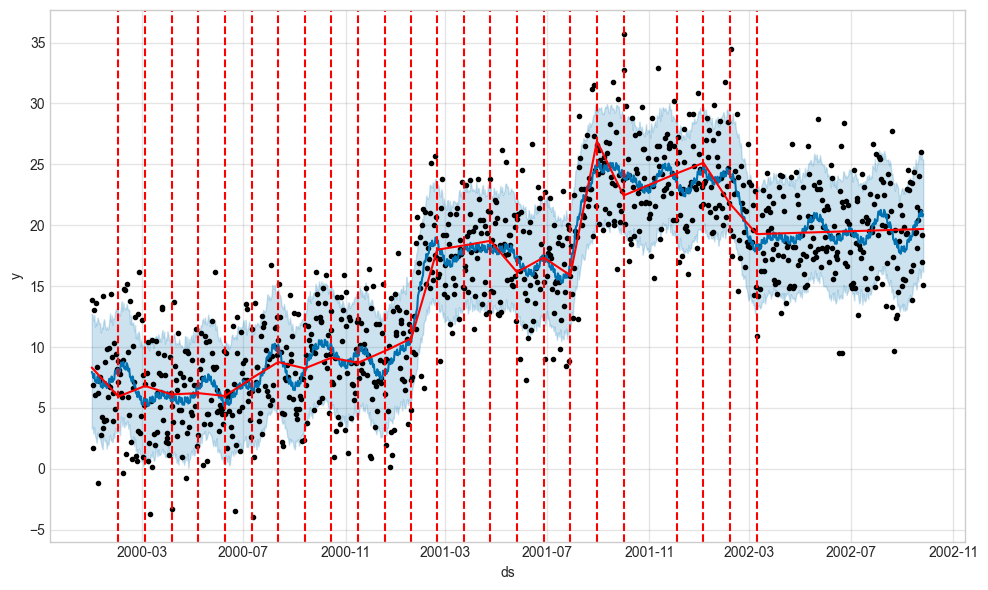

In [58]:
m = Prophet(n_changepoints=25, changepoint_range=0.8, changepoint_prior_scale=100)
forecast = m.fit(df_prophet).predict(df_prophet)

fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)